# Objetivo: testar o modelo treinado com 10k imagens e 34 épocas.

In [1]:
import os
import PIL
import math
import numpy as np

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

2021-08-10 17:05:52.952777: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-08-10 17:05:52.952858: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [4]:
# Definindo o caminho da pasta
PASTA_CHECKPOINT = r"/home/dangelo/dev/TCC/image-resolution/src/criacao_modelo/checkpoint"
ARQUIVO_CHECKPOINT: str = os.path.join(PASTA_CHECKPOINT, "meu-checkpoint")

In [21]:
def constroi_modelo(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)
    
    model = keras.Model(inputs, outputs)
    
    loss_fn = keras.losses.MeanSquaredError()
    optimizer = keras.optimizers.Adam(learning_rate=0.001)
    model.compile(
        optimizer=optimizer, loss=loss_fn,
    )
    return model


def conversor_alta_resolucao(modelo, img):
    ycbcr = img.convert("YCbCr")
    img_cinza, canal_cb, canal_cr = ycbcr.split()
    img_cinza = img_to_array(img_cinza)
    img_cinza = img_cinza.astype("float32") / 255.0

    entrada = np.expand_dims(img_cinza, axis=0)
    saida = modelo.predict(entrada)

    saida_img_cinza = saida[0]
    saida_img_cinza *= 255.0

    saida_img_cinza = saida_img_cinza.clip(0, 255)
    saida_img_cinza = saida_img_cinza.reshape(
        (np.shape(saida_img_cinza)[0], 
         np.shape(saida_img_cinza)[1])
    )

    saida_img_cinza = PIL.Image.fromarray(np.uint8(saida_img_cinza), mode="L")
    saida_canal_cb = canal_cb.resize(saida_img_cinza.size, PIL.Image.BICUBIC)
    saida_canal_cr = canal_cr.resize(saida_img_cinza.size, PIL.Image.BICUBIC)
    img_resultado = PIL.Image.merge("YCbCr", 
            (saida_img_cinza, saida_canal_cb, saida_canal_cr)).convert(
        "RGB"
    )
    return img_resultado


def abreImagem(nome):
    return PIL.Image.open(os.path.join(r"/home/dangelo/Downloads", nome))

In [6]:
# Construindo modelo do zero
modelo = constroi_modelo(upscale_factor=3, channels=1)

2021-08-10 17:10:45.970983: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2021-08-10 17:10:45.971008: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2021-08-10 17:10:45.971033: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (dangelo-mint): /proc/driver/nvidia/version does not exist
2021-08-10 17:10:45.971257: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [7]:
modelo.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d (Conv2D)              (None, None, None, 64)    1664      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 32)    18464     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 9)     2601      
_________________________________________________________________
tf.nn.depth_to_space (TFOpLa (None, None, None, 1)     0         
Total params: 59,657
Trainable params: 59,657
Non-trainable params: 0
_________________________________________________________

In [8]:
# Carregando os parâmetros
modelo.load_weights(ARQUIVO_CHECKPOINT)

In [11]:
# Definindo imagem de teste
pastaDownloads = r"/home/dangelo/Downloads"

imgPato = PIL.Image.open(os.path.join(pastaDownloads, "duck.png"))
display(imgPato)

2021-08-10 17:13:44.227125: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2021-08-10 17:13:44.248042: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 1999965000 Hz


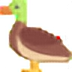

In [12]:
# Printando pato com modelo
imgPatoAumentado = conversor_alta_resolucao(modelo, imgPato)
display(imgPatoAumentado)

In [14]:
imgPatoAumentado.save(str(pastaDownloads + "/imgPatoAumentado.png"))

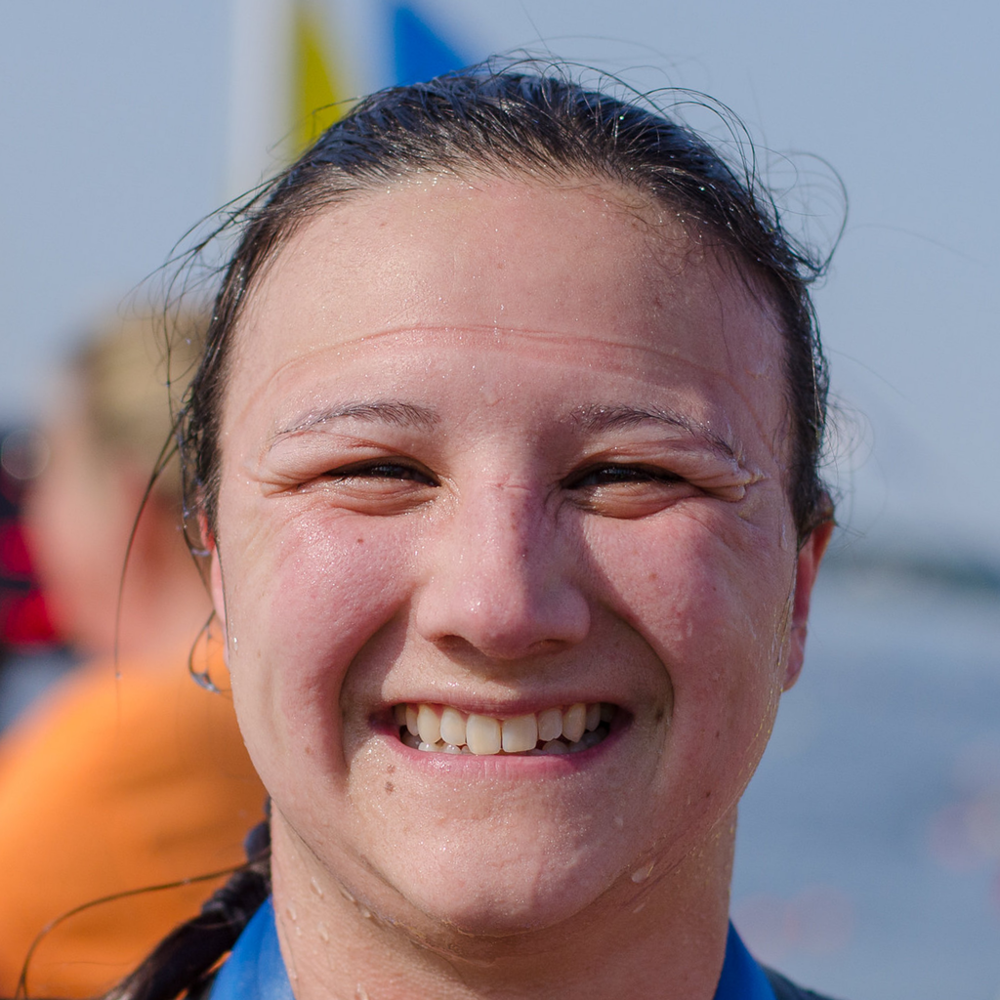

In [15]:
# Teste com img mulher
imgMulher = PIL.Image.open(os.path.join(pastaDownloads, "30000.png"))
display(imgMulher)

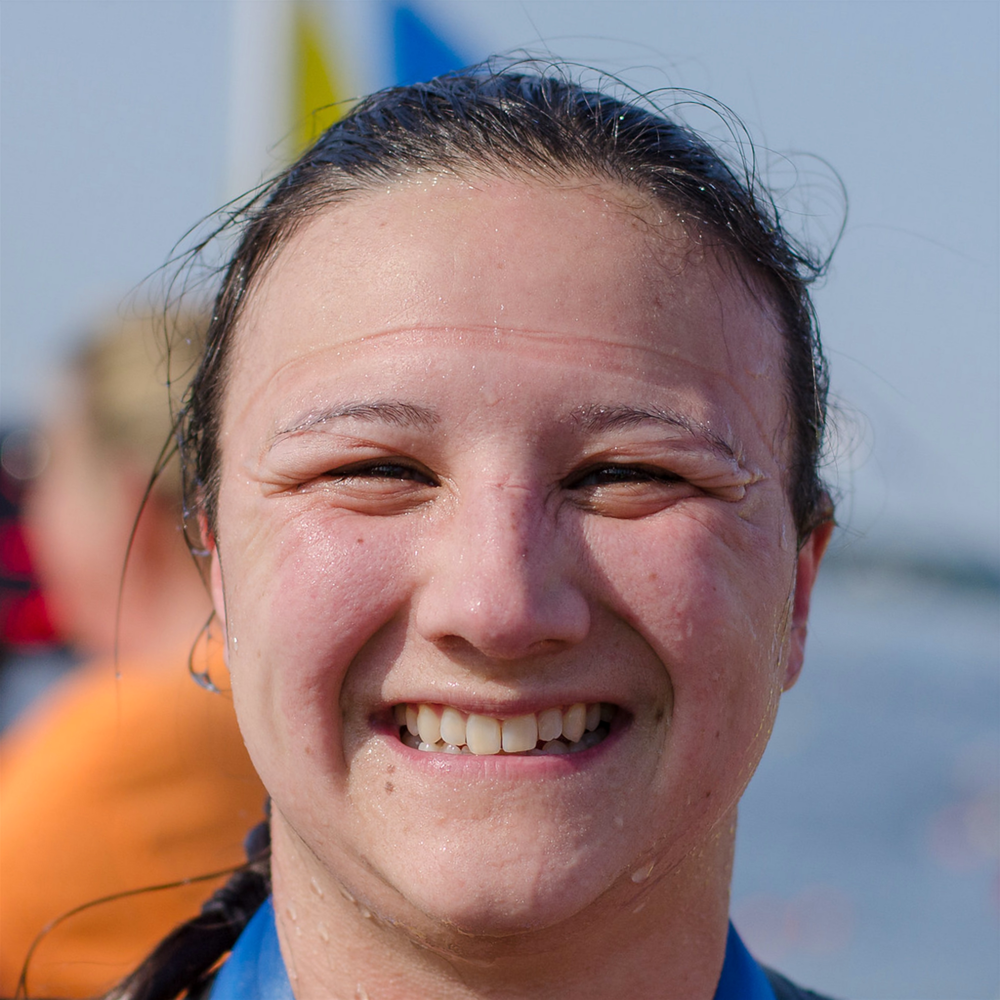

In [16]:
# Img mulher aumentada
imgMulherAumentada = conversor_alta_resolucao(modelo, imgMulher)
display(imgMulherAumentada)

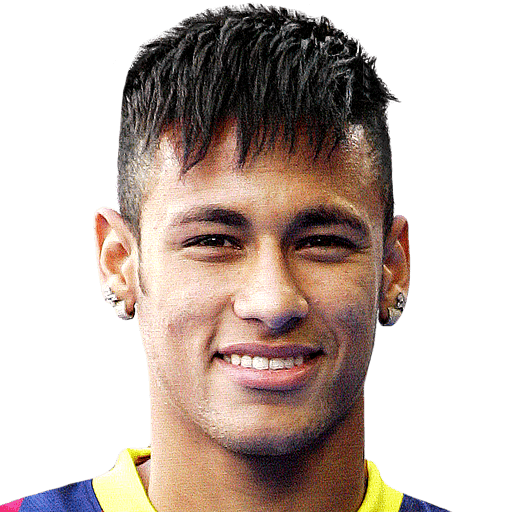

In [18]:
# Teste com img neymar
imgNeymar = PIL.Image.open(os.path.join(pastaDownloads, "neymar.png"))
display(imgNeymar)

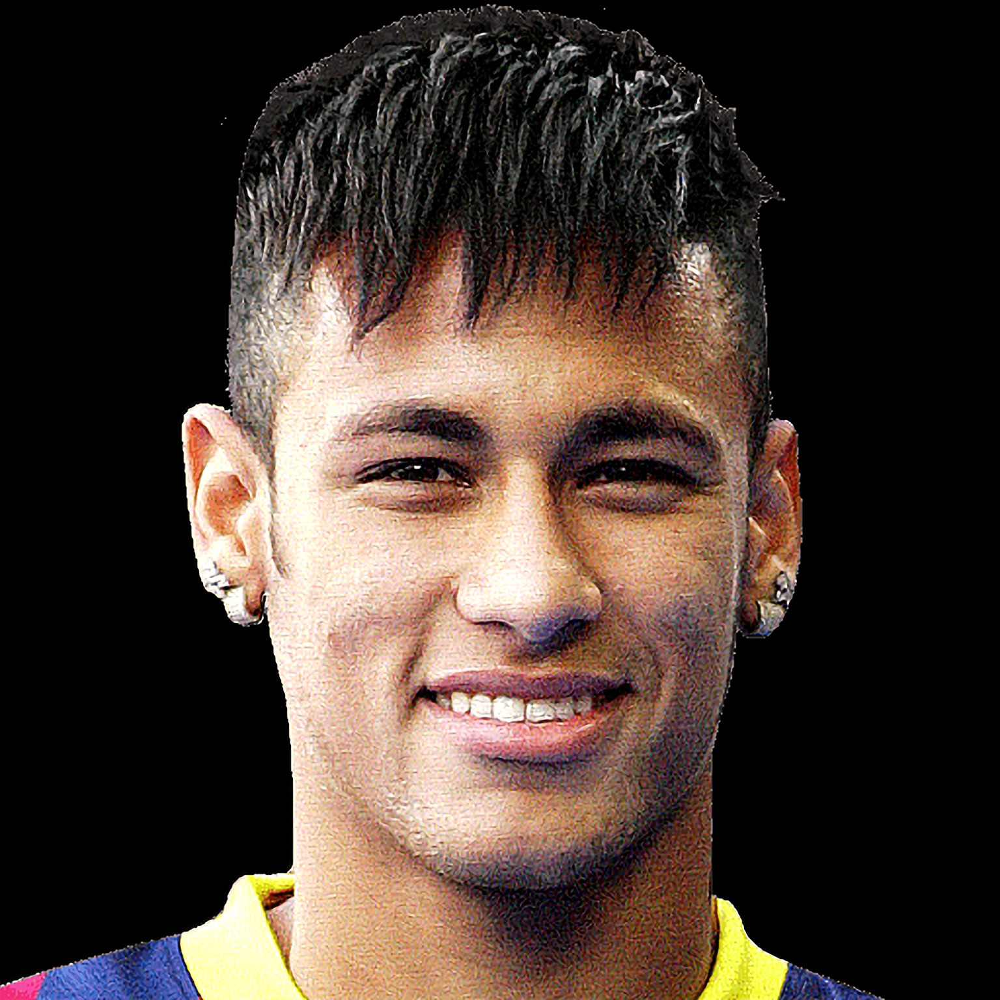

In [19]:
# Img neymar aumentado
imgNeymarAumentado = conversor_alta_resolucao(modelo, imgNeymar)
display(imgNeymarAumentado)

In [20]:
imgNeymarAumentado.save(str(pastaDownloads + "/neymar-aumentado.png"))

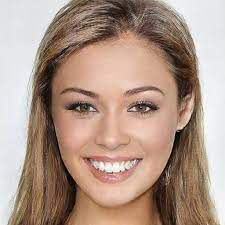

In [22]:
# Teste mulher 2
mulher2 = abreImagem("mulher2.jpeg")
display(mulher2)

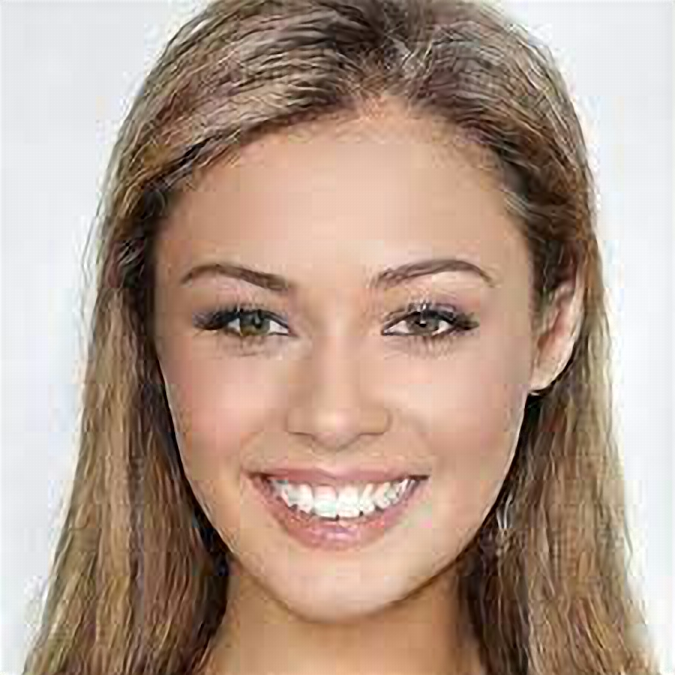

In [23]:
mulher2Aumentado = conversor_alta_resolucao(modelo, mulher2)
display(mulher2Aumentado)

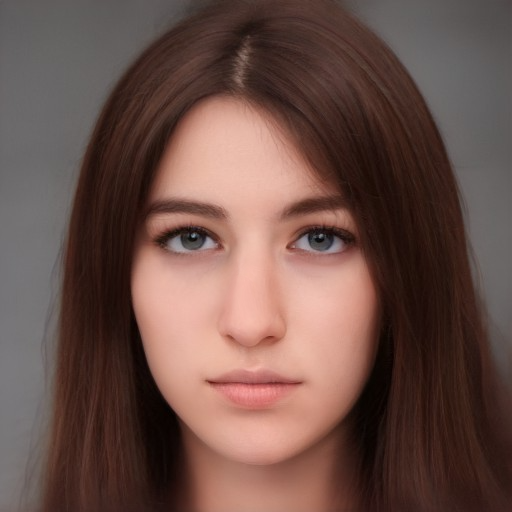

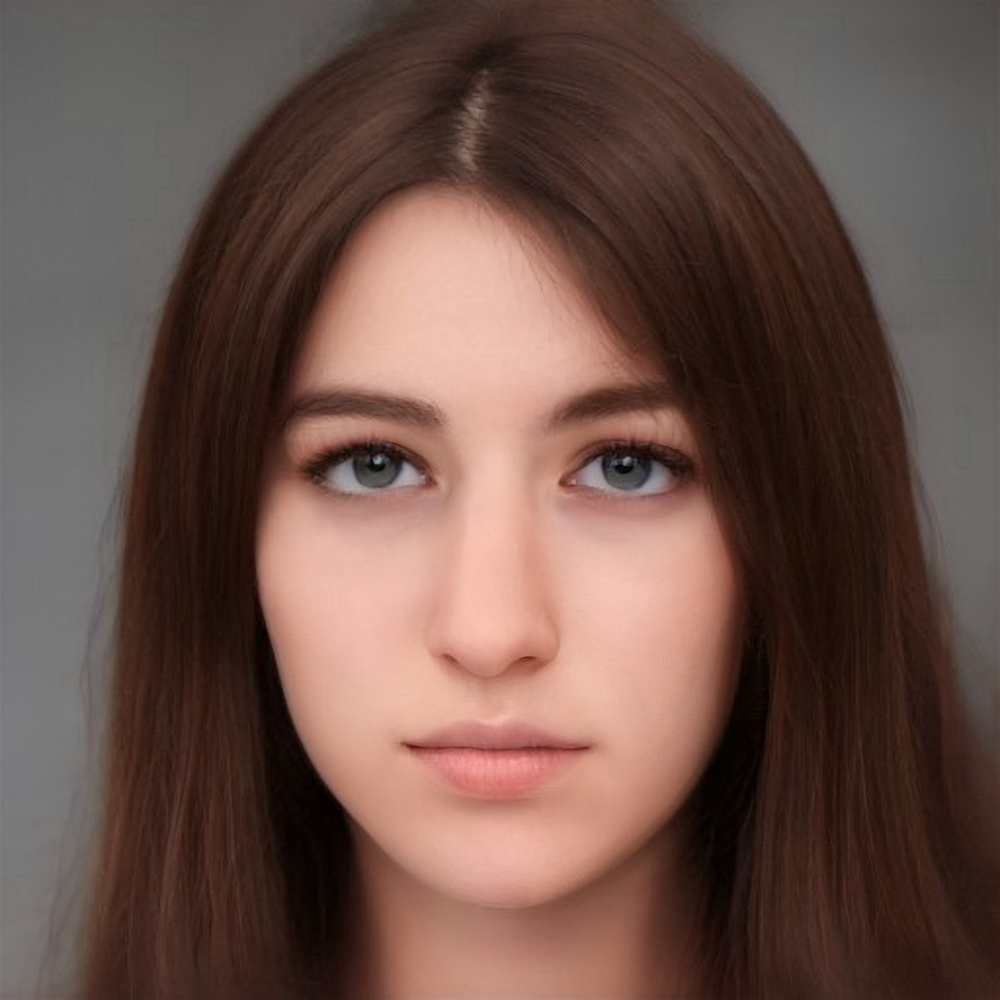

In [24]:
# Teste mulher 3
mulher3 = abreImagem("mulher3.png")
display(mulher3)

mulher3Aumentado = conversor_alta_resolucao(modelo, mulher3)
display(mulher3Aumentado)